In [2]:
import os
IN_KAGGLE = 'KAGGLE_URL_BASE' in os.environ
IN_KAGGLE

False

In [3]:
if IN_KAGGLE:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    secret_value = user_secrets.get_secret("gittoken2")
    !git clone https://{secret_value}@github.com/moienr/Palm-Segmentation-Phase2.git

In [4]:
if IN_KAGGLE:
    import time
    import os
    sleep_time = 5
    while not os.path.exists("/kaggle/working/Palm-Segmentation-Phase2"):
        print("didn't find the path, wating {sleep_time} more seconds...")
        time.sleep(sleep_time)
    print("path found...")
    import sys
    sys.path.append("/kaggle/working/Palm-Segmentation-Phase2/dataset")
    sys.path.append("/kaggle/working/Palm-Segmentation-Phase2")

In [5]:
import torch
# import albumentations as A
# from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
# from model import UNET
# from utils import (
#     load_checkpoint,
#     save_checkpoint,
#     check_accuracy,
#     save_predictions_as_imgs,
# )


c:\Users\moi3n\miniconda3\envs\pytorchGPU\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
import torch
torch.__version__

'1.13.1'

In [7]:
import numpy as np
from torch.utils.data import Dataset
import torch.nn.functional as F
from glob import glob
from skimage import io
import os
from torchvision import datasets, transforms
import matplotlib
import os
import gc
import random
from datetime import date, datetime
import json
import pprint
os.cpu_count()

20

In [8]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE

'cuda'

In [9]:
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

In [10]:
from dataset.data_loaders import *
from plot import plot_train_test_losses

In [11]:
transform = transforms.Compose([Normalize(),myToTensor(dtype=torch.float32)])

In [12]:
# Train Paths
if IN_KAGGLE:
    rgbn_dir = "..."

else:
    rgbn_dir = "D:\\python\\Palm-Segmentation-Phase2\\dataset\\rgbn_dataset_patched_small\\"
    
# Validation Paths
if IN_KAGGLE:
    rgbn_val_dir = "..."
else:
    rgbn_val_dir = "D:\\python\\Palm-Segmentation-Phase2\\dataset\\rgbn_dataset_patched_small\\"

In [13]:
train_dataset = RGBNirDataset(rgbn_dir, transform=transform)
valid_dataset = RGBNirDataset(rgbn_val_dir, transform=transform)

In [14]:
print(train_dataset[0][0].shape, train_dataset[0][1].shape)
print(valid_dataset[0][0].shape, valid_dataset[0][1].shape)


torch.Size([3, 256, 256]) torch.Size([1, 256, 256])
torch.Size([3, 256, 256]) torch.Size([1, 256, 256])


In [15]:
import os
import matplotlib.pyplot as plt

def plot_tensors(tensor1, tensor2, save_plots=False, folder = "plots//" ,name="1.png"):
    """Plot two tensors of shape (C, H, W) as images.
    Input:
    - tensor1: BGR Tensor of shape (C, H, W)
    - tensor2: Grayscale Tensor of shape (1, H, W)
    - save_plots: Boolean flag to save the plots as images
    - folder_path: Folder path to save the plots (required if save_plots is True)
    """
    tensor1 = (tensor1 + 1) / 2
    tensor2 = (tensor2 + 1) / 2
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(tensor1.permute(1, 2, 0)[:,:,[2,1,0]])
    
    axs[0].set_title('Tensor 1')
    im = axs[1].imshow(tensor2.squeeze(), cmap='YlGn')
    axs[1].set_title('Tensor 2')
    fig.colorbar(im, ax=axs[1])
    
    
    if save_plots:
        if not os.path.exists(folder):
            os.makedirs(folder)
        plt.savefig(folder+name)
    plt.show()

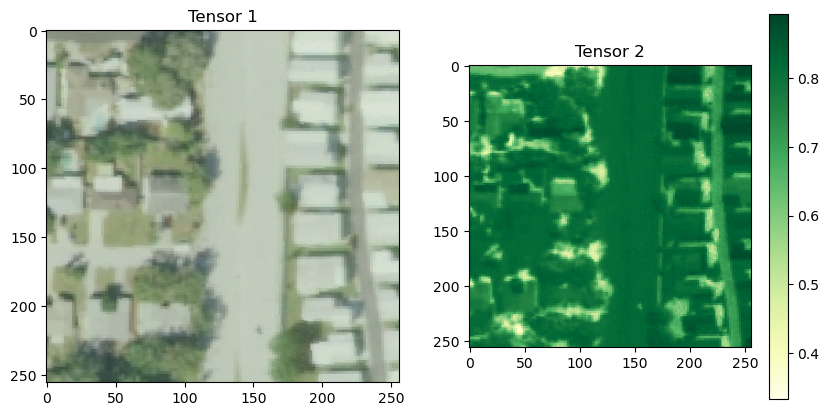

In [16]:
plot_tensors(train_dataset[15][0], train_dataset[15][1])

In [17]:
BATCH_SIZE = 16 if IN_KAGGLE else 1

In [18]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

In [19]:
len(train_loader)

16

In [20]:
next(iter(train_loader))[0].shape

torch.Size([1, 3, 256, 256])

In [21]:
from model import config
from model.utils import *
from model.train import train_fn

In [22]:
from model.discriminator_model import Discriminator
from model.generator_model import Generator

In [23]:
def train_fn(
    disc_rgb, disc_nir, gen_rgb, gen_nir, loader, opt_disc_rgb, opt_disc_nir, opt_gen_rgb, opt_gen_nir,
    l1, mse, d_scaler, g_scaler, save_frequency=100
):
    rgb_reals = 0
    rgb_fakes = 0
    loop = tqdm(loader, leave=True)
    
    # test gen_rgb
    # print(f"test gen_rgb")
    # x = torch.randn((1, 1, 256, 256)).to(DEVICE)
    # print(f"gen_rgb(x)_face.shape: {gen_rgb(x).shape}")

    for idx, (rgb,nir) in enumerate(loop):
        nir = nir.to(config.DEVICE)
        rgb = rgb.to(config.DEVICE)
        
        with torch.cuda.amp.autocast():
            # print(f"nir shape: {nir.shape} rgb shape: {rgb.shape}")
            fake_rgb = gen_rgb(nir)
            # print(f"fake_rgb shape: {fake_rgb.shape}")
            D_rgb_real = disc_rgb(rgb)
            D_rgb_fake = disc_rgb(fake_rgb.detach())
            rgb_reals += D_rgb_real.mean().item()
            rgb_fakes += D_rgb_fake.mean().item()
            D_rgb_real_loss = mse(D_rgb_real, torch.ones_like(D_rgb_real))
            D_rgb_fake_loss = mse(D_rgb_fake, torch.zeros_like(D_rgb_fake))
            D_rgb_loss = D_rgb_real_loss + D_rgb_fake_loss

            fake_nir = gen_nir(rgb)
            D_nir_real = disc_nir(nir)
            D_nir_fake = disc_nir(fake_nir.detach())
            D_nir_real_loss = mse(D_nir_real, torch.ones_like(D_nir_real))
            D_nir_fake_loss = mse(D_nir_fake, torch.zeros_like(D_nir_fake))
            D_nir_loss = D_nir_real_loss + D_nir_fake_loss

            # put it togethor
            D_loss = (D_rgb_loss + D_nir_loss) / 2

        opt_disc_rgb.zero_grad()
        opt_disc_nir.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc_rgb)
        d_scaler.step(opt_disc_nir)
        d_scaler.update()

        # Train Generators rgb and nir
        with torch.cuda.amp.autocast():
            # adversarial loss for both generators
            D_rgb_fake = disc_rgb(fake_rgb)
            D_nir_fake = disc_nir(fake_nir)
            loss_G_rgb = mse(D_rgb_fake, torch.ones_like(D_rgb_fake))
            loss_G_nir = mse(D_nir_fake, torch.ones_like(D_nir_fake))

            # cycle loss
            cycle_nir = gen_nir(fake_rgb)
            cycle_rgb = gen_rgb(fake_nir)
            cycle_nir_loss = l1(nir, cycle_nir)
            cycle_rgb_loss = l1(rgb, cycle_rgb)

            # identity loss (remove these for efficiency if you set lambda_identity=0)
            identity_nir = gen_nir(nir)
            identity_rgb = gen_rgb(rgb)
            identity_nir_loss = l1(nir, identity_nir)
            identity_rgb_loss = l1(rgb, identity_rgb)

            # add all togethor
            G_loss = (
                loss_G_nir
                + loss_G_rgb
                + cycle_nir_loss * config.LAMBDA_CYCLE
                + cycle_rgb_loss * config.LAMBDA_CYCLE
                + identity_rgb_loss * config.LAMBDA_IDENTITY
                + identity_nir_loss * config.LAMBDA_IDENTITY
            )

        opt_gen_rgb.zero_grad()
        opt_gen_nir.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen_rgb)
        g_scaler.step(opt_gen_nir)
        g_scaler.update()

        # if idx % save_frequency == 0:
        #     save_image(fake_rgb * 0.5 + 0.5, f"saved_images/rgb_{idx}.png")
        #     save_image(fake_nir * 0.5 + 0.5, f"saved_images/nir_{idx}.png")

        loop.set_postfix(rgb_real=rgb_reals / (idx + 1), rgb_fake=rgb_fakes / (idx + 1))

In [24]:
from eval_metrics.ssim import WSSIM
from eval_metrics.psnr import wpsnr
ssim = WSSIM(data_range=1)

In [25]:
def batch_eval_loop(loss_fn, labels: torch.Tensor, preds: torch.Tensor):
    loss_mean = 0
    for l, p in zip(labels, preds):
        l, p = l.unsqueeze(0), p.unsqueeze(0)
        l = l * 0.5 + 0.5
        p = p * 0.5 + 0.5
        loss = loss_fn((l, p))
        loss_mean += loss

    return loss_mean / len(labels)

In [26]:
def val_fn(disc_rgb, disc_nir, gen_rgb, gen_nir, loader, l1, mse):
    rgb_reals = 0
    rgb_fakes = 0
    nir_ssim = 0
    nir_psnr = 0
    loop = tqdm(loader, leave=True)

    for idx, (rgb,nir) in enumerate(loop):
        nir = nir.to(config.DEVICE)
        rgb = rgb.to(config.DEVICE)

        with torch.no_grad():
            # print(f"nir shape: {nir.shape} rgb shape: {rgb.shape}")
            fake_rgb = gen_rgb(nir)
            # print(f"fake_rgb shape: {fake_rgb.shape}")
            D_rgb_real = disc_rgb(rgb)
            D_rgb_fake = disc_rgb(fake_rgb.detach())
            rgb_reals += D_rgb_real.mean().item()
            rgb_fakes += D_rgb_fake.mean().item()
            D_rgb_real_loss = mse(D_rgb_real, torch.ones_like(D_rgb_real))
            D_rgb_fake_loss = mse(D_rgb_fake, torch.zeros_like(D_rgb_fake))
            D_rgb_loss = D_rgb_real_loss + D_rgb_fake_loss

            fake_nir = gen_nir(rgb)
            D_nir_real = disc_nir(nir)
            D_nir_fake = disc_nir(fake_nir.detach())
            D_nir_real_loss = mse(D_nir_real, torch.ones_like(D_nir_real))
            D_nir_fake_loss = mse(D_nir_fake, torch.zeros_like(D_nir_fake))
            D_nir_loss = D_nir_real_loss + D_nir_fake_loss
            
            # ssim
            nir_ssim =+ batch_eval_loop(ssim, nir, fake_nir)
            nir_psnr =+ batch_eval_loop(wpsnr, nir, fake_nir)

            # put it togethor
            D_loss = (D_rgb_loss + D_nir_loss) / 2

            # adversarial loss for both generators
            D_rgb_fake = disc_rgb(fake_rgb)
            D_nir_fake = disc_nir(fake_nir)
            loss_G_rgb = mse(D_rgb_fake, torch.ones_like(D_rgb_fake))
            loss_G_nir = mse(D_nir_fake, torch.ones_like(D_nir_fake))

            # cycle loss
            cycle_nir = gen_nir(fake_rgb)
            cycle_rgb = gen_rgb(fake_nir)
            cycle_nir_loss = l1(nir, cycle_nir)
            cycle_rgb_loss = l1(rgb, cycle_rgb)

            # identity loss (remove these for efficiency if you set lambda_identity=0)
            identity_nir = gen_nir(nir)
            identity_rgb = gen_rgb(rgb)
            identity_nir_loss = l1(nir, identity_nir)
            identity_rgb_loss = l1(rgb, identity_rgb)

            # add all togethor
            G_loss = (
                loss_G_nir
                + loss_G_rgb
                + cycle_nir_loss * config.LAMBDA_CYCLE
                + cycle_rgb_loss * config.LAMBDA_CYCLE
                + identity_rgb_loss * config.LAMBDA_IDENTITY
                + identity_nir_loss * config.LAMBDA_IDENTITY
            )

        loop.set_postfix(rgb_real=rgb_reals / (idx + 1), rgb_fake=rgb_fakes / (idx + 1), nir_ssim=nir_ssim / (idx + 1), nir_psnr = nir_psnr / (idx + 1))

    return (rgb_reals / (idx + 1), rgb_fakes / (idx + 1))

In [27]:
disc_rgb = Discriminator(in_channels=3).to(DEVICE)
disc_nir = Discriminator(in_channels=1).to(DEVICE)
gen_nir = Generator(in_channels=3,out_channels=1).to(DEVICE)
gen_rgb = Generator(in_channels=1,out_channels=3).to(DEVICE)



opt_disc_rgb = optim.Adam(disc_rgb.parameters(), lr=config.LEARNING_RATE, betas=(0.5, 0.999))
opt_disc_nir = optim.Adam(disc_nir.parameters(), lr=config.LEARNING_RATE, betas=(0.5, 0.999))

opt_gen_rgb = optim.Adam(gen_rgb.parameters(), lr=config.LEARNING_RATE, betas=(0.5, 0.999))
opt_gen_nir = optim.Adam(gen_nir.parameters(), lr=config.LEARNING_RATE, betas=(0.5, 0.999))



L1 = nn.L1Loss()
mse = nn.MSELoss()

g_scaler = torch.cuda.amp.GradScaler()
d_scaler = torch.cuda.amp.GradScaler()

In [28]:
def train_(loader, val_laoder, save_model=False, num_epochs=1, disc_rgb=None, disc_nir=None, gen_rgb=None, gen_nir=None, opt_disc_rgb=None, opt_disc_nir=None, opt_gen_rgb=None, opt_gen_nir=None, L1=None, mse=None, d_scaler=None, g_scaler=None):

    # if config.LOAD_MODEL:
    #     load_checkpoint(
    #         config.CHECKPOINT_GEN_rgb,
    #         gen_rgb,
    #         opt_gen,
    #         config.LEARNING_RATE,
    #     )
    #     load_checkpoint(
    #         config.CHECKPOINT_GEN_nir,
    #         gen_nir,
    #         opt_gen,
    #         config.LEARNING_RATE,
    #     )
    #     load_checkpoint(
    #         config.CHECKPOINT_CRITIC_rgb,
    #         disc_rgb,
    #         opt_disc,
    #         config.LEARNING_RATE,
    #     )
    #     load_checkpoint(
    #         config.CHECKPOINT_CRITIC_nir,
    #         disc_nir,
    #         opt_disc,
    #         config.LEARNING_RATE,
    #     )




    for epoch in range(num_epochs):
        print(f"Epoch [{epoch}/{num_epochs}]", end="\n")
        print("Train Step: ", end="")
        train_fn(
            disc_rgb,
            disc_nir,
            gen_rgb,
            gen_nir,
            loader,
            opt_disc_rgb, opt_disc_nir,
            opt_gen_rgb, opt_gen_nir,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )
        print("Validation Step: ", end="")
        val_fn(
            disc_rgb,
            disc_nir,
            gen_rgb,
            gen_nir,
            val_laoder,
            L1,
            mse,)

        # if save_model:
        #     save_checkpoint(gen_rgb, opt_gen, filename=config.CHECKPOINT_GEN_rgb)
        #     save_checkpoint(gen_nir, opt_gen, filename=config.CHECKPOINT_GEN_nir)
        #     save_checkpoint(disc_rgb, opt_disc, filename=config.CHECKPOINT_CRITIC_rgb)
        #     save_checkpoint(disc_nir, opt_disc, filename=config.CHECKPOINT_CRITIC_nir)



In [ ]:
NUM_EPOCHS = 1 if IN_KAGGLE else 1

In [29]:
train_(train_loader, valid_loader, save_model=False, num_epochs=NUM_EPOCHS, disc_rgb=disc_rgb,
       disc_nir=disc_nir, gen_rgb=gen_rgb, gen_nir=gen_nir, opt_disc_rgb=opt_disc_rgb,
       opt_disc_nir=opt_disc_nir, opt_gen_rgb=opt_gen_rgb, opt_gen_nir=opt_gen_nir, L1=L1,
       mse=mse, d_scaler=d_scaler, g_scaler=g_scaler)

Epoch [0/3]
Train Step: 

100%|██████████| 16/16 [00:08<00:00,  1.99it/s, rgb_fake=0.497, rgb_real=0.505]


Validation Step: 

100%|██████████| 16/16 [00:03<00:00,  4.15it/s, nir_psnr=0.6, nir_ssim=0.00344, rgb_fake=0.496, rgb_real=0.519]  


Epoch [1/3]
Train Step: 

100%|██████████| 16/16 [00:06<00:00,  2.63it/s, rgb_fake=0.487, rgb_real=0.525]


Validation Step: 

100%|██████████| 16/16 [00:04<00:00,  3.58it/s, nir_psnr=0.723, nir_ssim=0.00378, rgb_fake=0.471, rgb_real=0.534]


Epoch [2/3]
Train Step: 

100%|██████████| 16/16 [00:06<00:00,  2.38it/s, rgb_fake=0.462, rgb_real=0.539]


Validation Step: 

100%|██████████| 16/16 [00:04<00:00,  3.43it/s, nir_psnr=0.492, nir_ssim=0.00568, rgb_fake=0.462, rgb_real=0.561]


In [30]:
if IN_KAGGLE:
    torch.save(gen_rgb, 'gen_rgb.pth')

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


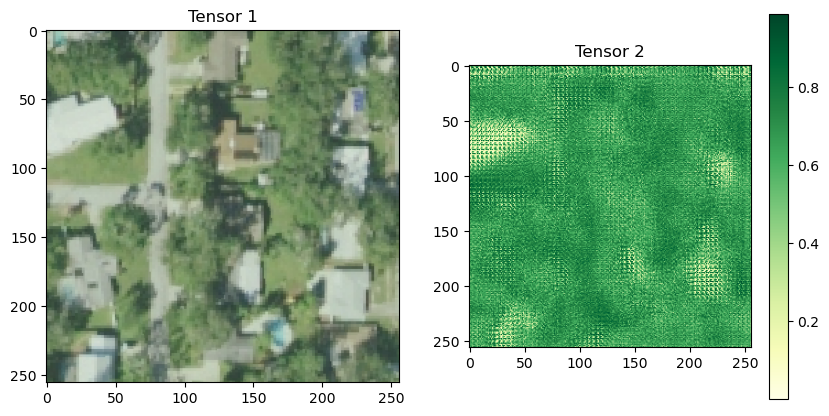

In [31]:
indx = 0
sample = valid_dataset[indx]
rgb = sample[0].unsqueeze(0)
nir = sample[1].unsqueeze(0)
print(f"rgb.shape: {rgb.shape}")
fake_nir = gen_nir(rgb.to(DEVICE))
print(f"fake_nir.shape: {fake_nir.shape}")
plot_tensors(rgb[0], fake_nir[0].detach().cpu(),save_plots=True, folder="plots//", name=str(indx) + ".png")

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


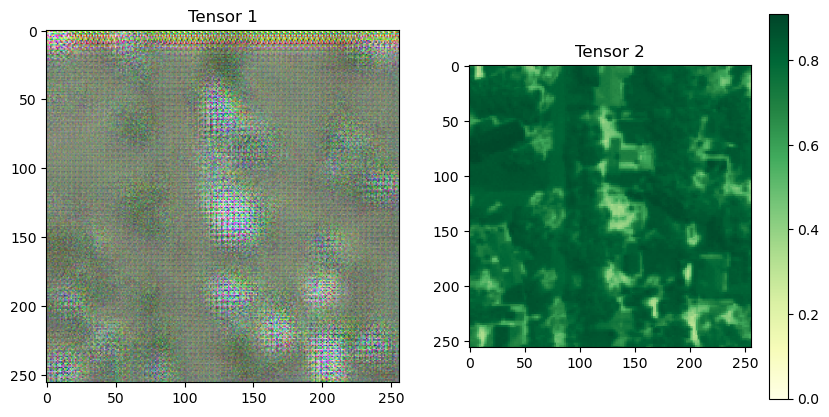

In [32]:
print(f"nir.shape: {nir.shape}")
fake_rgb = gen_rgb(nir.to(DEVICE))
print(f"fake_nir.shape: {fake_rgb.shape}")
plot_tensors(fake_rgb[0].detach().cpu(),nir[0], folder="plots//", name=str(indx) + ".png")

[3, 0, 10, 14, 8, 7, 9, 6, 2, 13]
rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


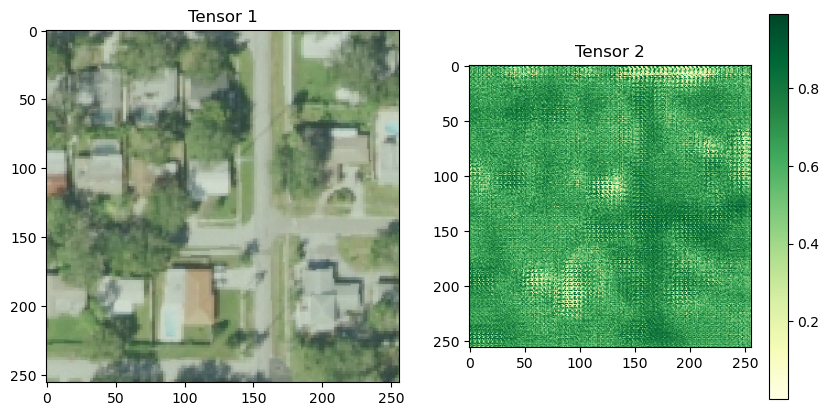

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


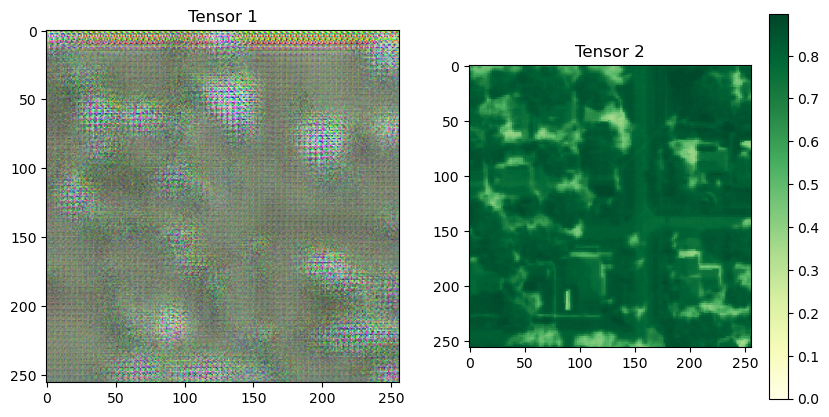

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


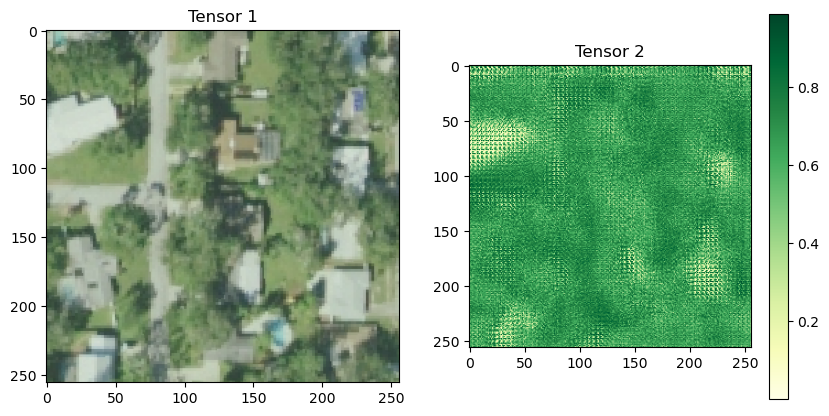

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


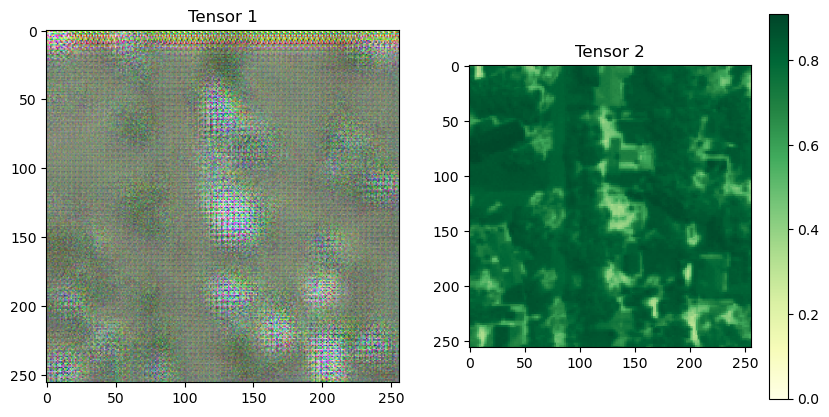

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


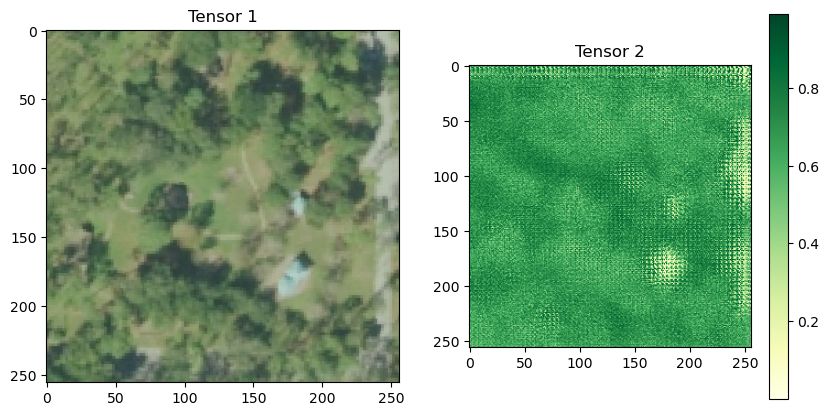

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


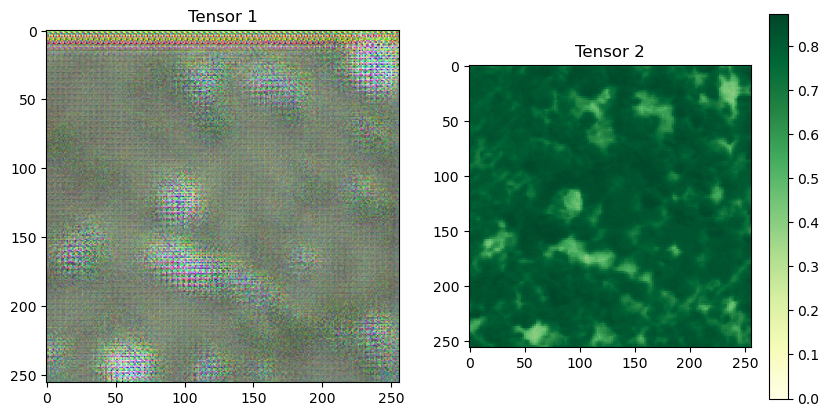

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


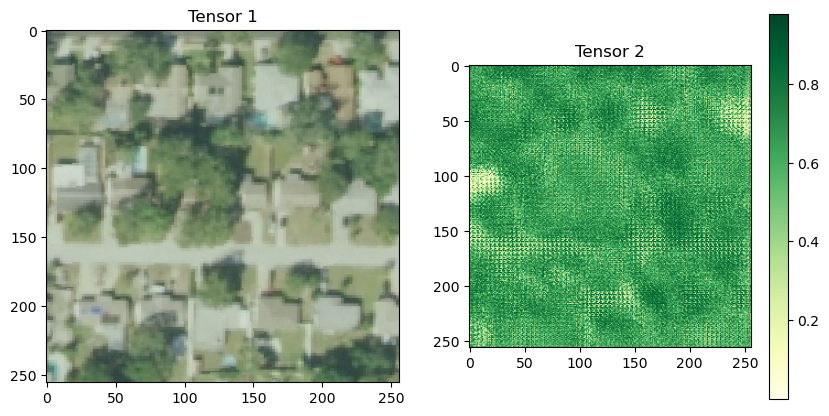

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


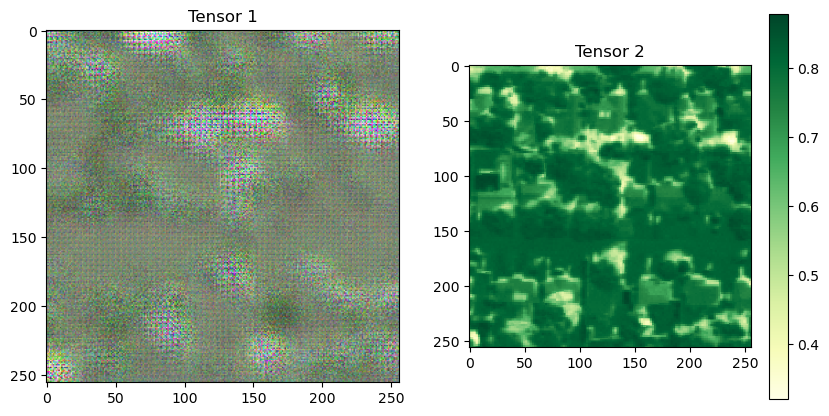

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


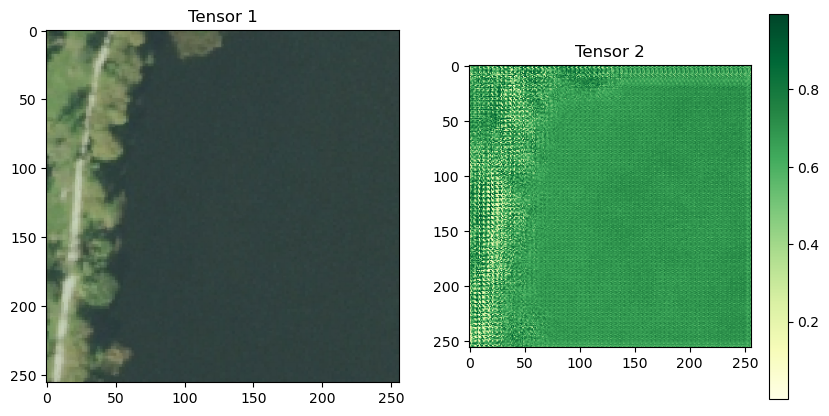

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


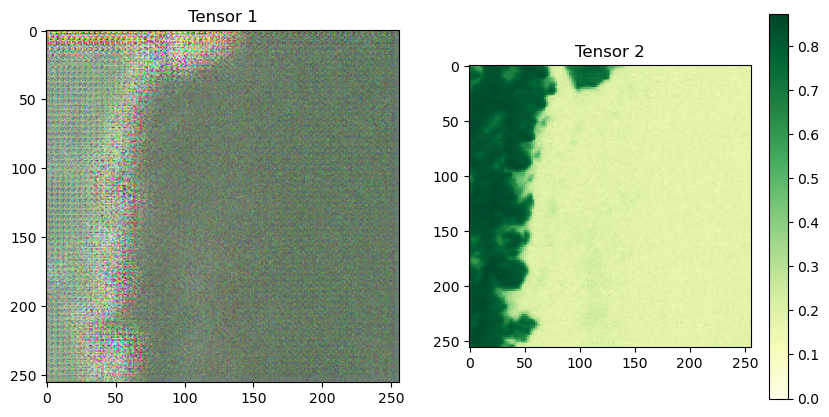

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


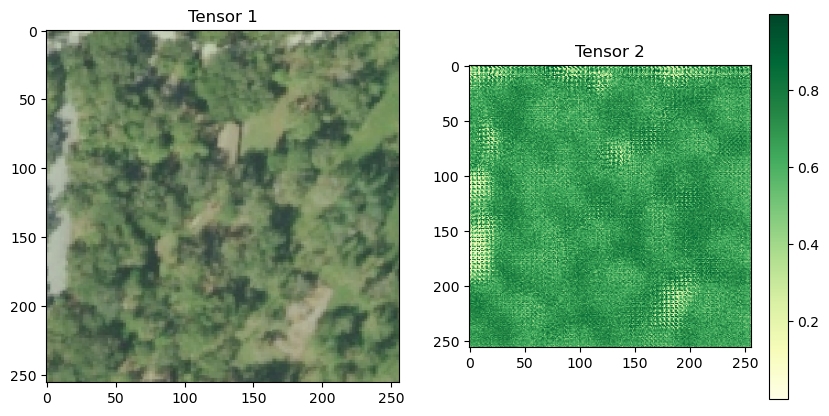

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


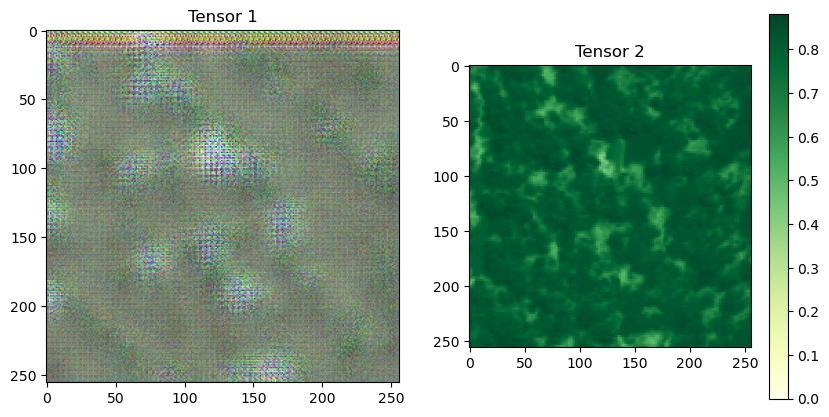

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


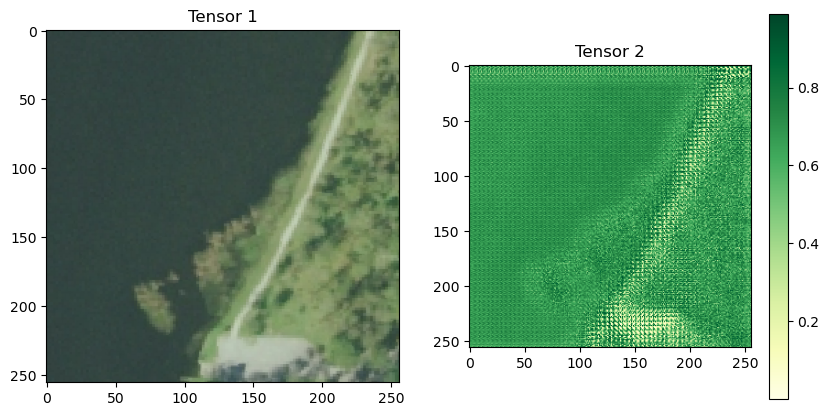

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


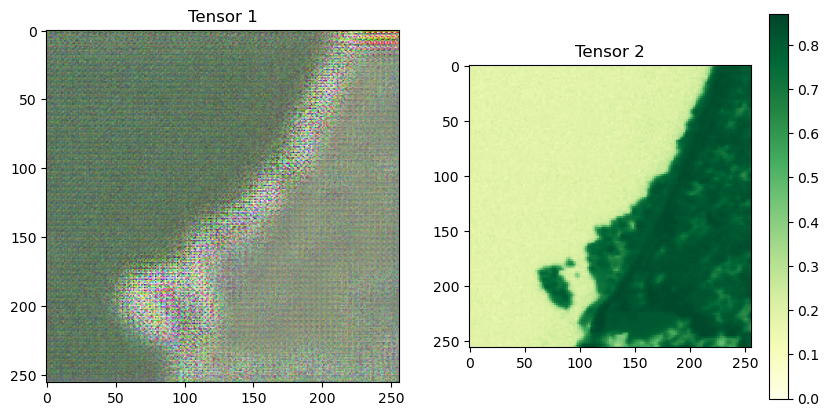

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


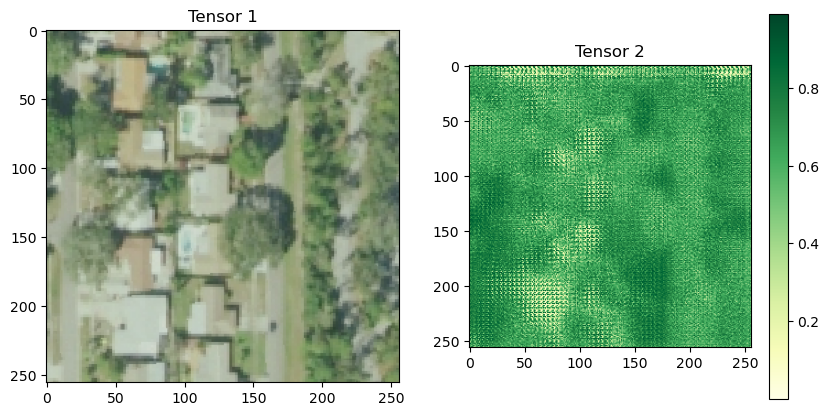

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


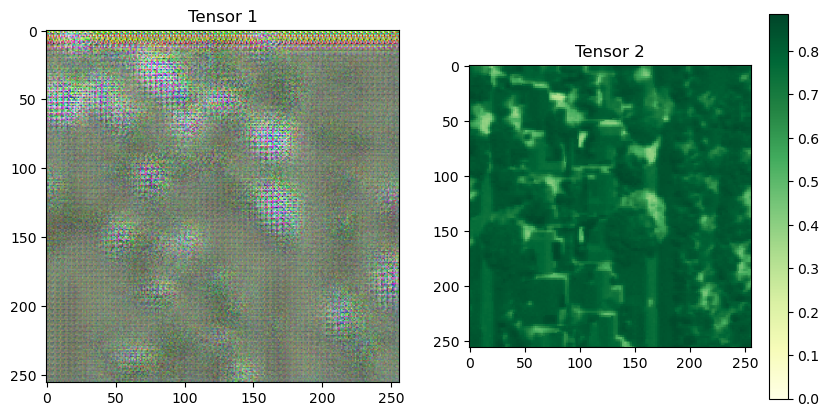

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


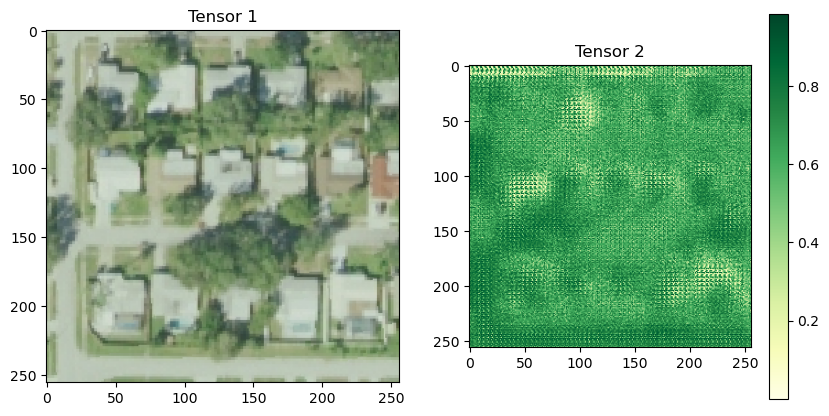

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


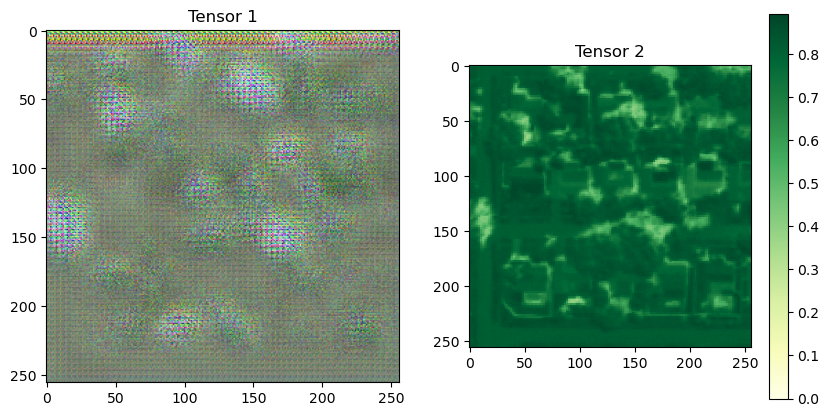

rgb.shape: torch.Size([1, 3, 256, 256])
fake_nir.shape: torch.Size([1, 1, 256, 256])


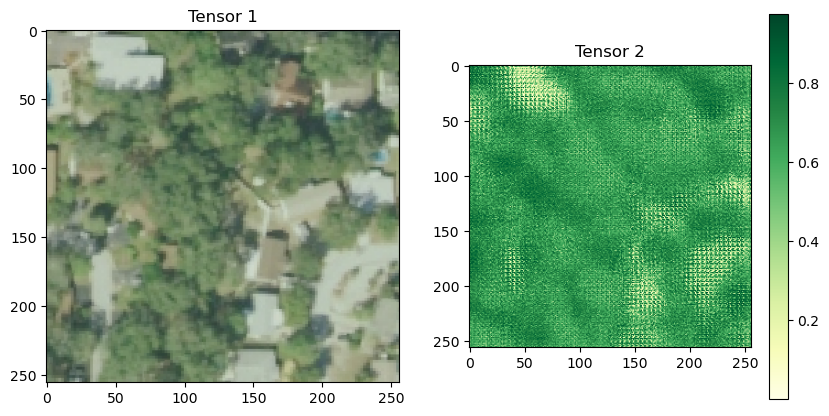

nir.shape: torch.Size([1, 1, 256, 256])
fake_nir.shape: torch.Size([1, 3, 256, 256])


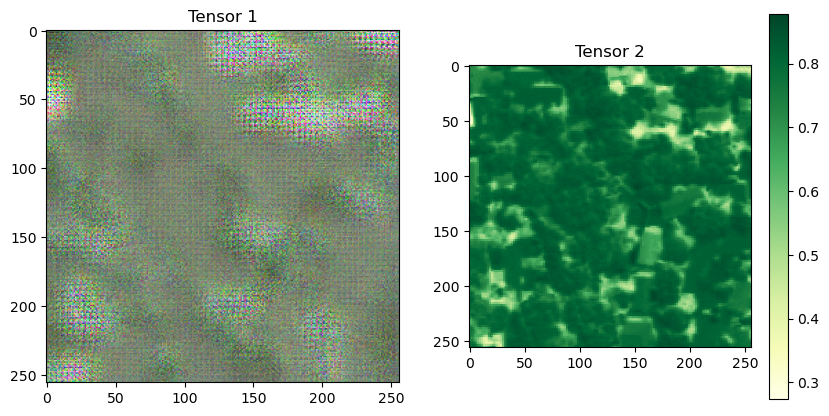

In [33]:
import random

# assuming the dataset is a list or numpy array
dataset_length = len(valid_dataset)
random_indices = random.sample(range(dataset_length), 10)
print(random_indices)
for indx in random_indices:
    sample = valid_dataset[indx]
    rgb = sample[0].unsqueeze(0)
    nir = sample[1].unsqueeze(0)
    print(f"rgb.shape: {rgb.shape}")
    fake_nir = gen_nir(rgb.to(DEVICE))
    print(f"fake_nir.shape: {fake_nir.shape}")
    plot_tensors(rgb[0], fake_nir[0].detach().cpu(),save_plots=True, folder="plots//", name=str(indx)+"f_nir" + ".jpg")
    print(f"nir.shape: {nir.shape}")
    fake_rgb = gen_rgb(nir.to(DEVICE))
    print(f"fake_nir.shape: {fake_rgb.shape}")
    plot_tensors(fake_rgb[0].detach().cpu(),nir[0], folder="plots//", name=str(indx)+"f_rgb" + ".jpg")
